In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline


In [2]:
data  = pd.read_csv('data/data.csv')

In [3]:
data.head()

,name,year,url,uri,explicit,genre,artist,artist_uri,artist_popularity,artist_genres,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,track_popularity
0,Mambo No 5,1950,https://open.spotify.com/track/3fQLXoRwKQTnThn...,3fQLXoRwKQTnThncdMCqwG,False,pop,Pérez Prado,1ZKhPkCXXgtiGgALn4OYtT,48,"mambo,space age pop",...,0,0.3400,0.360,0.75300,0.0358,0.807,180.624,156975,4,41
1,Que Rico Mambo,1950,https://open.spotify.com/track/1uwSOYXZoxgSqhn...,1uwSOYXZoxgSqhn8FIkfH1,False,pop,Pérez Prado,1ZKhPkCXXgtiGgALn4OYtT,48,"mambo,space age pop",...,1,0.1130,0.621,0.00168,0.1410,0.544,106.879,236227,4,33
2,Cherry Pink and Apple Blossom White,1950,https://open.spotify.com/track/0xgulEfXsdV2fyl...,0xgulEfXsdV2fyl8i5OF6O,False,pop,Pérez Prado,1ZKhPkCXXgtiGgALn4OYtT,48,"mambo,space age pop",...,1,0.0430,0.556,0.81600,0.0986,0.726,118.424,183843,4,32
3,Mambo Jambo,1950,https://open.spotify.com/track/6AG5jVPwROJ3Vp2...,6AG5jVPwROJ3Vp2C0mETvN,False,pop,Pérez Prado,1ZKhPkCXXgtiGgALn4OYtT,48,"mambo,space age pop",...,1,0.0492,0.645,0.83900,0.1380,0.914,121.305,190147,4,29
4,Mambo No. 8,1950,https://open.spotify.com/track/1zj2Tu2goqddyco...,1zj2Tu2goqddycoNosJZGz,False,pop,Pérez Prado,1ZKhPkCXXgtiGgALn4OYtT,48,"mambo,space age pop",...,0,0.0995,0.466,0.00190,0.1530,0.840,142.451,165893,4,30


In [4]:
data.columns

Index(['name', 'year', 'url', 'uri', 'explicit', 'genre', 'artist',
       'artist_uri', 'artist_popularity', 'artist_genres', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'time_signature', 'track_popularity'],
      dtype='object')

In [13]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(data, x='year', y=sound_features,title='Year Vs Sound Features')
fig.show()


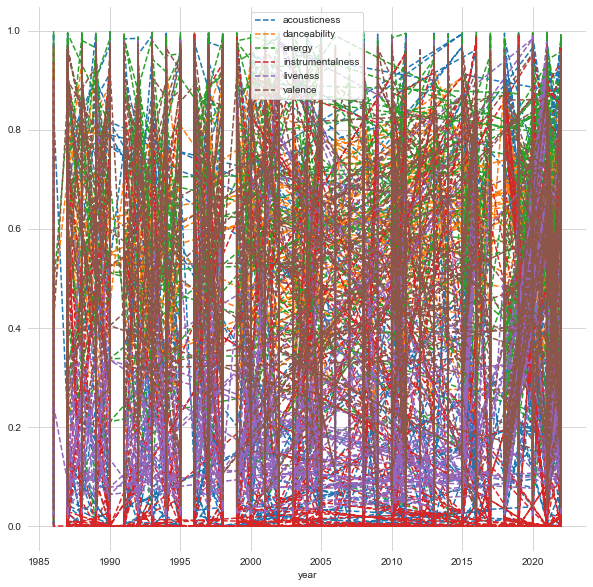

In [5]:
zerotoone = data[['acousticness', 'danceability',
                    'energy', 'instrumentalness',
                    'liveness', 'valence','year']]
df = zerotoone.copy()
dfn = df[df.year > 1985]
dfn =dfn.reset_index(drop=True)
dfn.set_index('year',inplace=True)

sns.set_style('whitegrid')
dfn.plot(figsize=(10,10),style='--')
sns.despine(left = True,bottom=True)

<AxesSubplot:xlabel='mode', ylabel='count'>

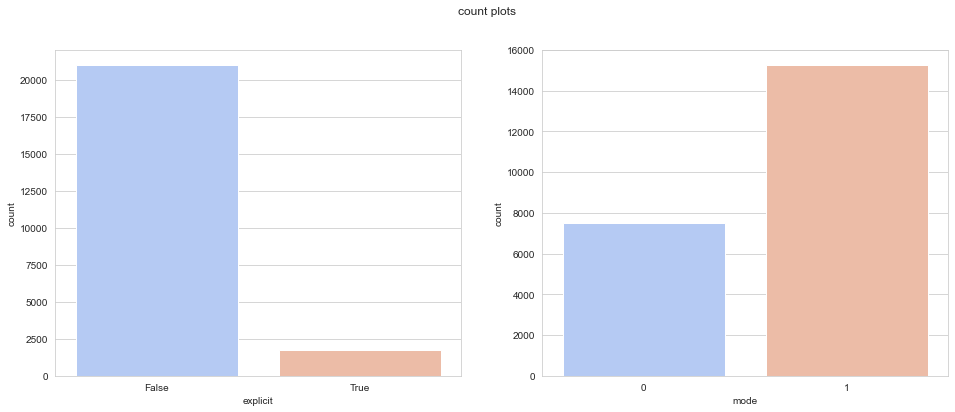

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

fig.suptitle('count plots')

sns.countplot(ax=axes[0],x='explicit',data=data,palette='coolwarm')
sns.countplot(ax=axes[1],x='mode',data=data,palette='coolwarm')

<AxesSubplot:xlabel='track_popularity', ylabel='Count'>

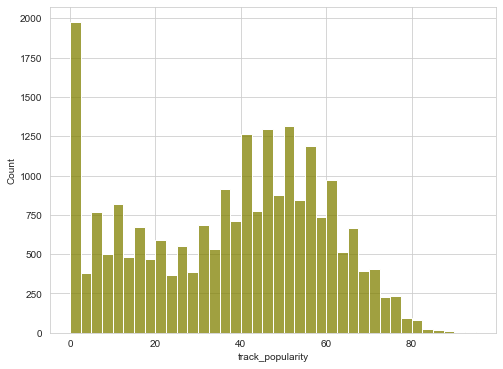

In [6]:
plt.figure(figsize=(8,6))
sns.histplot(x='track_popularity',data=data,color="olive")

In [14]:
df = data[data['track_popularity']>85][['name','artist','track_popularity','year','time_signature']]
fig = px.scatter(df,x='year', y='track_popularity',color='name',size='time_signature')
fig.show()

<AxesSubplot:>

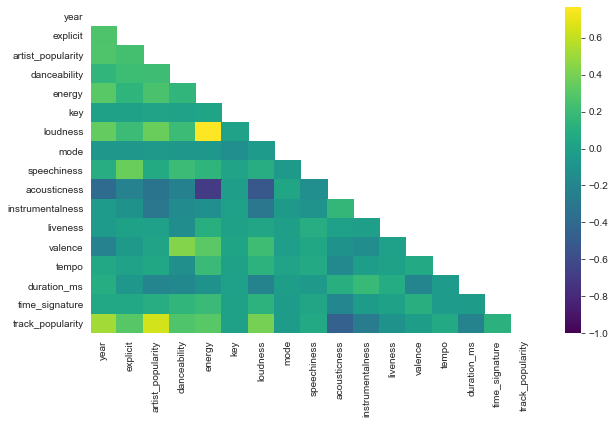

In [7]:
plt.figure(figsize=(10,6))

corr = data.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,vmin=-1,cmap='viridis',annot=False)

In [8]:
corr[abs(corr['track_popularity']) > 0.25]['track_popularity']

year                 0.520559
explicit             0.298563
artist_popularity    0.646139
danceability         0.280084
energy               0.307038
loudness             0.396140
acousticness        -0.456176
instrumentalness    -0.273371
track_popularity     1.000000
Name: track_popularity, dtype: float64

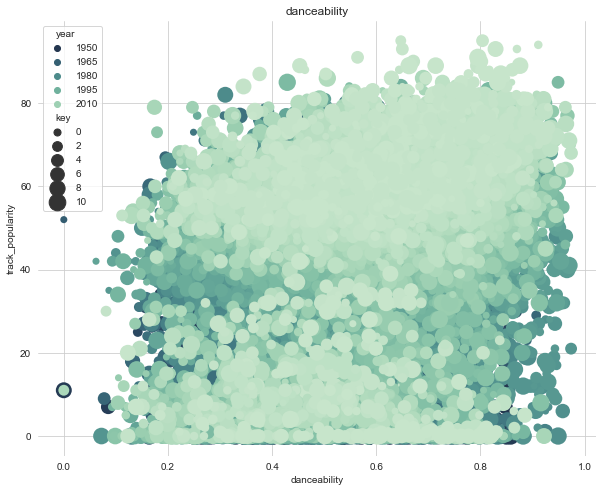

In [32]:
plt.figure(figsize=(10,8))
sns.set_style('whitegrid')
sns.scatterplot(x="danceability", y="track_popularity",
                hue="year", size="key",
                palette="ch:r=-.4,d=.2_r",
                sizes=(50, 300), linewidth=0,
                data=data,legend=True).set(title='danceability')
sns.despine(left = True,bottom=True)

In [9]:
post = data[data['artist'].str.contains('Christina Aguilera')]
ed = data[data['artist'].str.contains('Ed Sheeran')]
kw = data[data['artist'].str.contains('Doris Day')]
dra = data[data['artist'].str.contains('Drake')]
cb = data[data['artist'].str.contains('Chris Brown')]

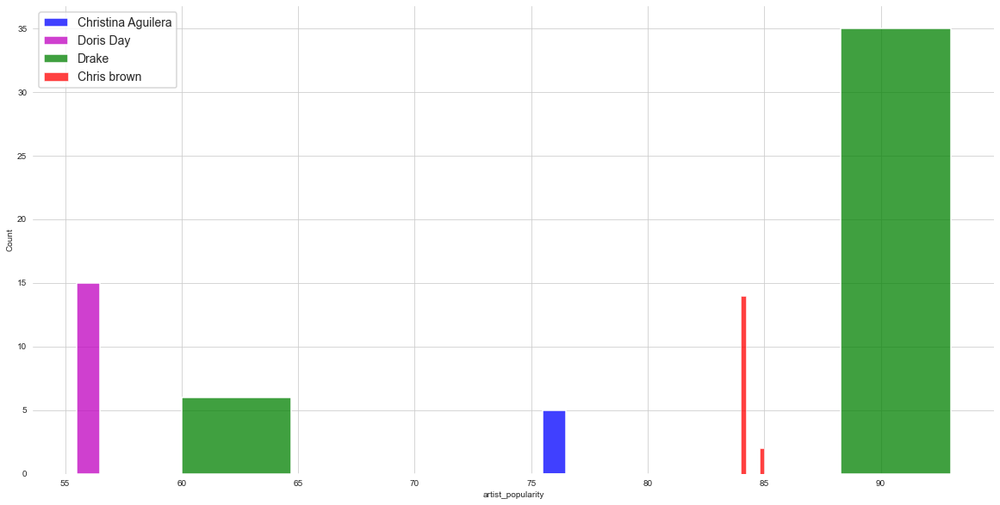

In [10]:
fig, ax = plt.subplots(figsize=(20,10))
sns.despine(fig, left=True, bottom=True)
sns.set_context("talk",font_scale=1, rc={"lines.linewidth": 2.5})

sns.histplot(post['artist_popularity'], color='b',label="Christina Aguilera")
sns.histplot(ed['artist_popularity'], color='b',label="Ed Sheeran")
sns.histplot(kw['artist_popularity'], color='m',label="Doris Day")
sns.histplot(dra['artist_popularity'], color='g',label="Drake")
sns.histplot(cb['artist_popularity'], color='r',label="Chris brown")

ax.legend(fontsize = 14)

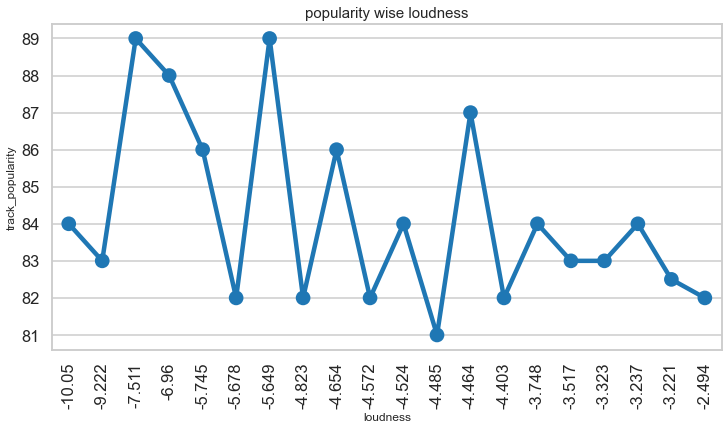

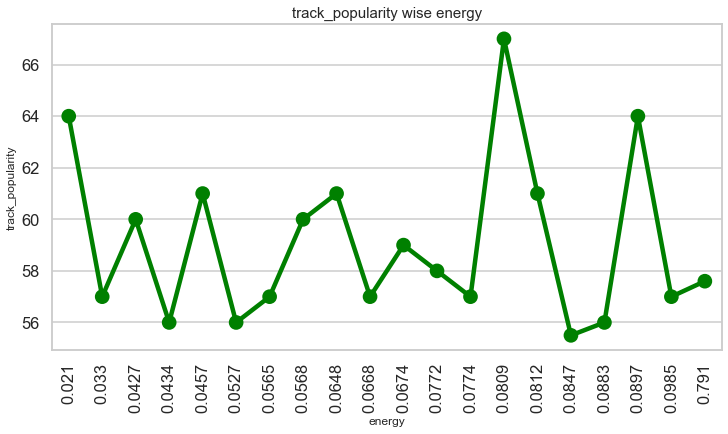

In [11]:
ld = data.groupby("loudness")["track_popularity"].mean().sort_values(ascending=False).head(20).reset_index()
ac = data.groupby("acousticness")["track_popularity"].mean().sort_values(ascending=False).head(20).reset_index()
en = data.groupby("energy")["track_popularity"].mean().sort_values(ascending=False).head(20).reset_index()
ins = data.groupby("instrumentalness")["track_popularity"].mean().sort_values(ascending=False).head(20).reset_index()


plt.figure(figsize=(12,6))
sns.pointplot(data=ld,x="loudness", y='track_popularity')#,ax=axes[0])
#, color=color[4])
plt.xlabel('loudness', fontsize=12)
plt.ylabel('track_popularity', fontsize=12)
plt.title("popularity wise loudness", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

plt.figure(figsize=(12,6))
sns.pointplot(data=en,x="energy", y='track_popularity',color='g')#,ax=axes[1])
#, color=color[4])
plt.xlabel('energy', fontsize=12)
plt.ylabel('track_popularity', fontsize=12)
plt.title("track_popularity wise energy", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()


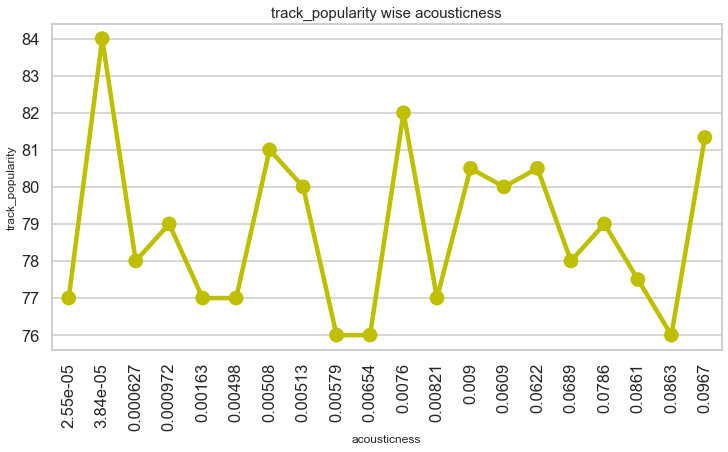

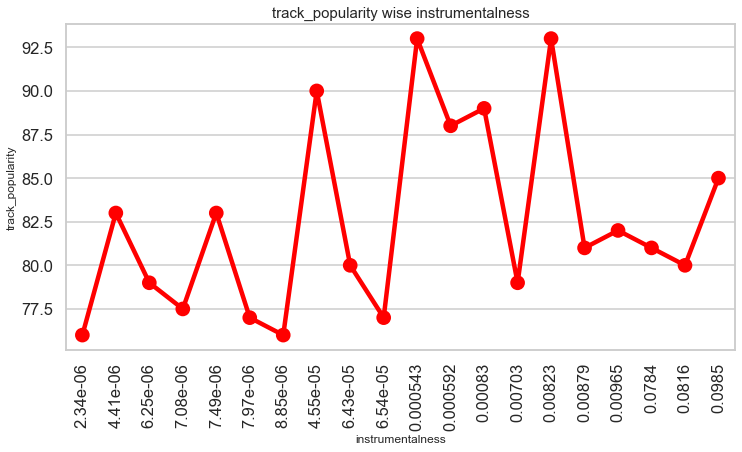

In [36]:
plt.figure(figsize=(12,6))
sns.pointplot(data=ac,x="acousticness", y='track_popularity',color='y')#,ax=axes[0])
#, color=color[4])
plt.xlabel('acousticness', fontsize=12)
plt.ylabel('track_popularity', fontsize=12)
plt.title("track_popularity wise acousticness", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

plt.figure(figsize=(12,6))
sns.pointplot(data=ins,x="instrumentalness", y='track_popularity',color='r')#,ax=axes[0])
#, color=color[4])
plt.xlabel('instrumentalness', fontsize=12)
plt.ylabel('track_popularity', fontsize=12)
plt.title("track_popularity wise instrumentalness", fontsize=15)
plt.xticks(rotation='vertical')
plt.show()

In [12]:
top10_genres = data.nlargest(10, 'track_popularity')

fig = px.bar(top10_genres, x='genre', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()